In [1]:
#Python package imports
import glob
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import iqr, chisquare
from scipy.optimize import curve_fit
from astroquery.gaia import Gaia

Created TAP+ (v1.2.1) - Connection:
	Host: gea.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443
Created TAP+ (v1.2.1) - Connection:
	Host: geadata.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443


In [2]:
#Retrieving properties of cataloged Cepheids from the public Gaia tables.
job = Gaia.launch_job_async("select top 9575 * from gaiadr2.vari_cepheid order by source_id")
r = job.get_results()

INFO: Query finished. [astroquery.utils.tap.core]


In [3]:
lc_files = glob.glob('lc_*.txt')
len(lc_files)

16

## Animation Explaining Phase Folding 

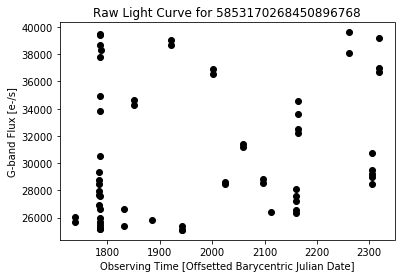

In [11]:
#fold_example_id = 4663622004241681280
fold_example_id = 5853170268450896768
#def RawCurver(lc_file):
#source_id = np.loadtxt(lc_file,skiprows=1,delimiter=',',usecols=0, dtype=np.int64)
#fold_example_id = source_id[0]
per = r['pf'][np.argwhere(r['source_id']==fold_example_id)][0][0]
per_error = r['pf_error'][np.argwhere(r['source_id']==fold_example_id)][0][0]
lc_file = 'lc_'+str(fold_example_id)+'.txt'
lcs = np.loadtxt(lc_file,skiprows=1,delimiter=',',usecols=(3,4,5,6,7))
band = np.loadtxt(lc_file,skiprows=1,delimiter=',',usecols=2, dtype=np.str)
time = lcs[:,0]
mag = lcs[:,1]
flux = lcs[:,2]
flux_error = lcs[:,3]
G_ind = np.argwhere(band=='G')
time_G = time[G_ind[0][0]:G_ind[-1][0]]
mag_G = mag[G_ind[0][0]:G_ind[-1][0]]
flux_G = flux[G_ind[0][0]:G_ind[-1][0]]
flux_error_G = flux_error[G_ind[0][0]:G_ind[-1][0]]
mag_error_G = (2.5/np.log(10))*flux_error_G/flux_G
phase = time_G % per / per
plt.scatter(time_G, flux_G, c='k')
plt.title('Raw Light Curve for '+str(fold_example_id))
plt.xlabel('Observing Time [Offsetted Barycentric Julian Date]')
plt.ylabel('G-band Flux [e-/s]')
#plt.savefig('Raw_LC_'+str(fold_example_id)+'.png', bbox_inches='tight', dpi=300)
plt.show()

In [8]:
lc_files = glob.glob('lc_*.txt')
#for i in range(0,len(lc_files)):
    #RawCurver(lc_files[i])

In [52]:
per*1.0005
.0005 * 100

0.05

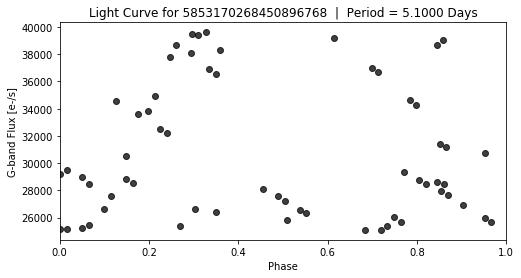

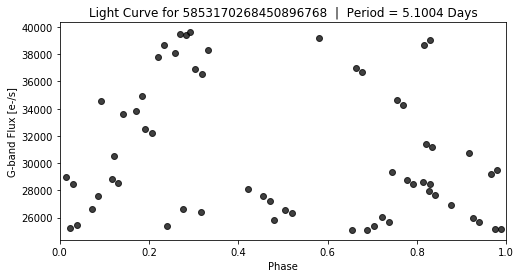

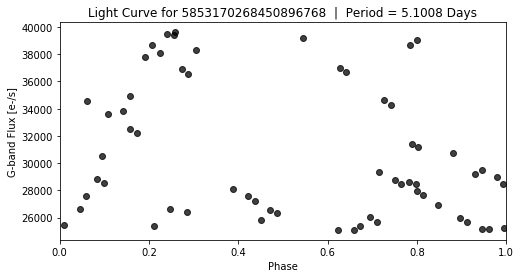

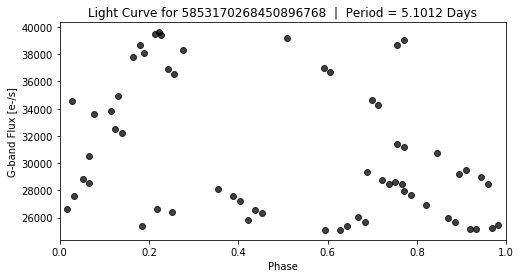

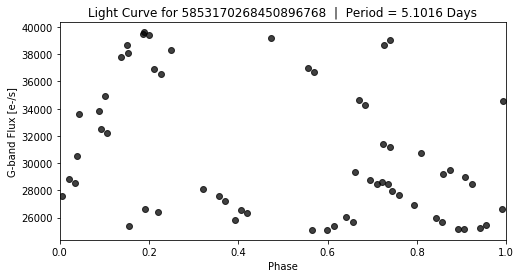

...

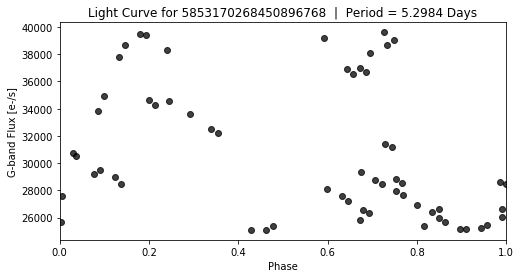

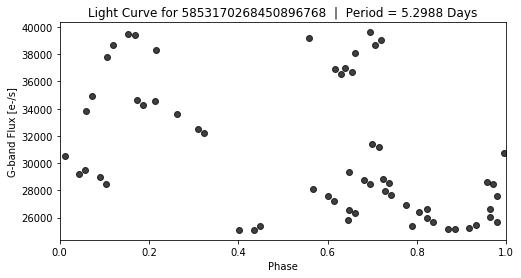

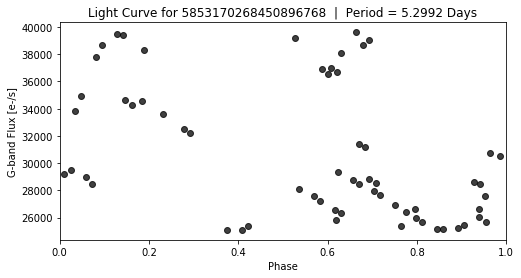

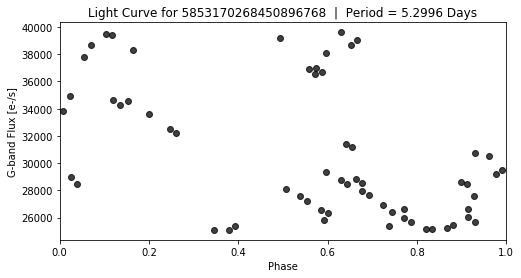

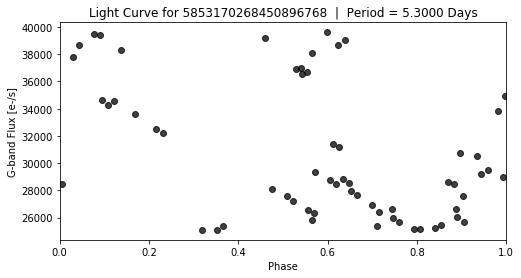

In [41]:
per_gif = np.linspace(5.1,5.3,num=500)
phase_color = []
for i in range(0,len(per_gif)):
    if per/1.0005 < per_gif[i] < per*1.0005:
        color= 'g'
    else:
        color = 'k'
    phase_color.append(color)
for i in range(0,len(per_gif)):
    phase_gif = time_G % per_gif[i] / per_gif[i]
    plt.figure(figsize=(8,4)) 
    plt.scatter(phase_gif, flux_G, alpha=0.75, c=phase_color[i])
    plt.title('Light Curve for '+str(fold_example_id)+'  |  Period = '+str('%.4f'%per_gif[i])+' Days')
    plt.xlabel('Phase')
    plt.ylabel('G-band Flux [e-/s]')
    plt.xlim(0,1)
    #plt.savefig('PhaseFold_'+str('%.4f'%per_gif[i])+'.png', bbox_inches='tight', dpi=300)
    plt.show()

In [6]:
np.linspace(per/1.25,per*1.25,num=12)

array([4.06664079, 4.27459401, 4.48254723, 4.69050045, 4.89845368,
       5.1064069 , 5.31436012, 5.52231334, 5.73026656, 5.93821979,
       6.14617301, 6.35412623])

## Increasing the Degrees of the Fourier Fit

In [7]:
def OneDegFit(x,p,amp1,amp2,C):
    p = per
    deg1 = (np.sin(2*np.pi*x/p)*amp1) + (np.cos(2*np.pi*x/p)*amp2)
    return C + deg1

def ThreeDegFit(x,p,amp1,amp2,amp3,amp4,amp5,amp6,C):
        p = per
        deg1 = (np.sin(2*np.pi*x/p)*amp1) + (np.cos(2*np.pi*x/p)*amp2)
        deg2 = (np.sin(2*np.pi*2*x/p)*amp3) + (np.cos(2*np.pi*2*x/p)* amp4)
        deg3 = (np.sin(2*np.pi*3*x/p)*amp5) + (np.cos(2*np.pi*3*x/p)* amp6)
        return C + deg1 + deg2 + deg3

def FiveDegFit(x,p,amp1,amp2,amp3,amp4,amp5,amp6,amp7,amp8,amp9,amp10,C):
        p = per
        deg1 = (np.sin(2*np.pi*x/p)*amp1) + (np.cos(2*np.pi*x/p)*amp2)
        deg2 = (np.sin(2*np.pi*2*x/p)*amp3) + (np.cos(2*np.pi*2*x/p)* amp4)
        deg3 = (np.sin(2*np.pi*3*x/p)*amp5) + (np.cos(2*np.pi*3*x/p)* amp6)
        deg4 = (np.sin(2*np.pi*4*x/p)*amp7) + (np.cos(2*np.pi*4*x/p)* amp8)
        deg5 = (np.sin(2*np.pi*5*x/p)*amp9) + (np.cos(2*np.pi*5*x/p)* amp10)
        return C + deg1 + deg2 + deg3 + deg4 + deg5

def SevDegFit(x,p,amp1,amp2,amp3,amp4,amp5,amp6,amp7,amp8,amp9,amp10,amp11,amp12,amp13,amp14,C):
        p = per
        deg1 = (np.sin(2*np.pi*x/p)*amp1) + (np.cos(2*np.pi*x/p)*amp2)
        deg2 = (np.sin(2*np.pi*2*x/p)*amp3) + (np.cos(2*np.pi*2*x/p)* amp4)
        deg3 = (np.sin(2*np.pi*3*x/p)*amp5) + (np.cos(2*np.pi*3*x/p)* amp6)
        deg4 = (np.sin(2*np.pi*4*x/p)*amp7) + (np.cos(2*np.pi*4*x/p)* amp8)
        deg5 = (np.sin(2*np.pi*5*x/p)*amp9) + (np.cos(2*np.pi*5*x/p)* amp10)
        deg6 = (np.sin(2*np.pi*6*x/p)*amp11) + (np.cos(2*np.pi*6*x/p)* amp12)
        deg7 = (np.sin(2*np.pi*7*x/p)*amp13) + (np.cos(2*np.pi*7*x/p)* amp14)
        return C + deg1 + deg2 + deg3 + deg4 + deg5 + deg6 + deg7

    
guess_freq = 1
guess_amp = 3*np.std(flux_G)/(2**0.5)
guess_C = np.mean(flux_G)
p0_7=[guess_freq,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_C]

guess_freq = 1
guess_amp = 3*np.std(flux_G)/(2**0.5)
guess_C = np.mean(flux_G)
p0_1=[guess_freq,guess_amp,guess_amp,guess_C]
p0_3=[guess_freq,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_C]
p0_5=[guess_freq,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_C]
p0_7=[guess_freq,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_amp,guess_C]

In [8]:
fit_flux1 = curve_fit(OneDegFit, phase, flux_G, p0=p0_1)
fit_flux3 = curve_fit(ThreeDegFit, phase, flux_G, p0=p0_3)
fit_flux5 = curve_fit(FiveDegFit, phase, flux_G, p0=p0_5)
fit_flux7 = curve_fit(SevDegFit, phase, flux_G, p0=p0_7, sigma=flux_error_G, absolute_sigma=True)
x = np.linspace(min(phase),max(phase),num=2**16)
fitcurve_flux1 = OneDegFit(x, *fit_flux1[0])
fitcurve_flux3 = ThreeDegFit(x, *fit_flux3[0])
fitcurve_flux5 = FiveDegFit(x, *fit_flux5[0])
fitcurve_flux7 = SevDegFit(x, *fit_flux7[0])
#fit_mag = curve_fit(SevDegFit, phase, mag_G, p0=p02, sigma=mag_error_G, absolute_sigma=True)
#fitcurve_mag = SevDegFit(x, *fit_mag[0])

print(p0_7)
print(fit_flux7[0])
print(fitcurve_flux7)

[1, 5165.3569742713635, 5165.3569742713635, 5165.3569742713635, 5165.3569742713635, 5165.3569742713635, 5165.3569742713635, 5165.3569742713635, 5165.3569742713635, 5165.3569742713635, 5165.3569742713635, 5165.3569742713635, 5165.3569742713635, 5165.3569742713635, 5165.3569742713635, 14081.766273034755]
[ 1.00000000e+00 -2.82510258e+05 -4.17518090e+09  3.93757850e+09
  5.45747520e+09 -6.46096233e+09 -2.02597635e+09  4.20719653e+09
 -1.34101352e+09 -1.14789214e+09  1.44547760e+09  4.25595233e+07
 -4.53467242e+08  2.33299899e+07  4.53550737e+07  1.04734377e+09]
[13584.17623974 13583.83049021 13583.48498914 ... 13504.10421058
 13503.31065011 13502.51620504]


D:\Python\Anaconda\lib\site-packages\scipy\optimize\minpack.py:787: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


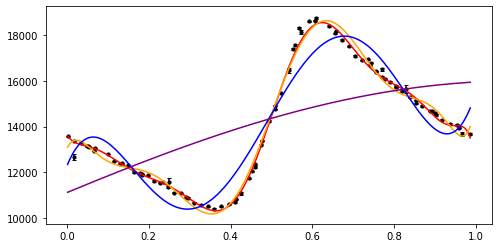

In [9]:
plt.figure(figsize=(8,4)) 
plt.errorbar(phase, flux_G, yerr=flux_error_G, ls='None', ecolor='k', capsize=2)
plt.scatter(phase, flux_G, c='k', s=10)
plt.plot(x, fitcurve_flux7, c='r')
plt.plot(x, fitcurve_flux5, c='orange')
plt.plot(x, fitcurve_flux3, c='blue')
plt.plot(x, fitcurve_flux1, c='purple')
plt.show()

## Animation Describing the Selected 16 Cepheids

In [6]:
lc_files = glob.glob('lc_*.txt')
my16_pers = []
my16_mags = []
my16_nums = []
my16_ids = []
for i in range(0, len(lc_files)):
    source_id = np.loadtxt(lc_files[i],skiprows=1,delimiter=',',usecols=0, dtype=np.int64)
    ceph_source = source_id[0]
    #per = r['pf'][np.argwhere(r['source_id']==ceph_source)][0][0]
    #per = per[0][0]
    #mag = r['int_average_g'][np.argwhere(r['source_id']==ceph_source)][0][0]
    lcs = np.loadtxt(lc_files[i],skiprows=1,delimiter=',',usecols=(3,4,5,6,7))
    band = np.loadtxt(lc_files[i],skiprows=1,delimiter=',',usecols=2, dtype=np.str)
    time = lcs[:,0]    
    G_ind = np.argwhere(band=='G')
    time_G = time[G_ind[0][0]:G_ind[-1][0]]
    num = len(time_G)
    #my16_pers.append(per)
    #my16_mags.append(mag)
    my16_nums.append(num)
    my16_ids.append(ceph_source)
    #phase = (time_G % per) / per
    #print(num
    #plt.scatter(per, mag)
#plt.title('Selected Good-Fitting Cepheids from Gaia DR2')
#plt.xlabel('Period of Fundamental Pulsation Mode [day]')
#plt.ylabel('G-band Intensity-Averaged Magnitude [mag]')
#plt.gca().invert_yaxis()
#plt.show()


[69, 111, 109, 106, 68, 84, 78, 65, 89, 91, 81, 73, 95, 62, 68, 62]
[4659494849927324288, 4659661632076538752, 4660422150542501504, 4660537698007124480, 4661781868464576512, 4661959748834771840, 4662030048864250624, 4662093683088745600, 4663622004241681280, 4663622004241681408, 506581226385580288, 506602976101284736, 509629965971797376, 5853170268450896768, 5932569709575669504, 5932997939411720960]


In [21]:
print(my16_nums[13])
print(my16_ids[13])

62
5853170268450896768


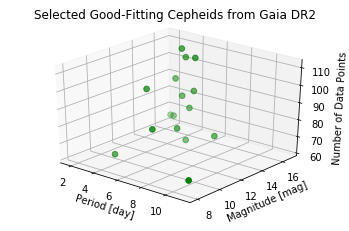

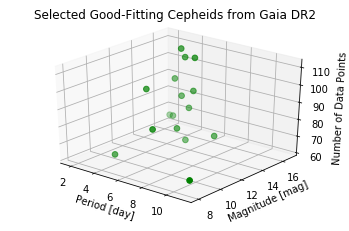

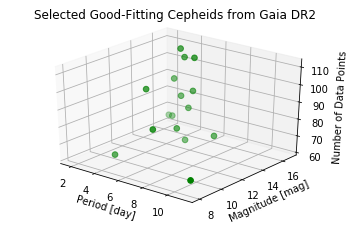

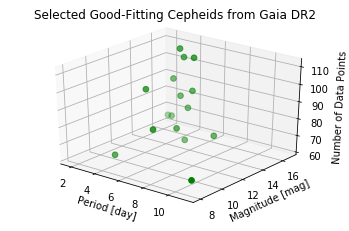

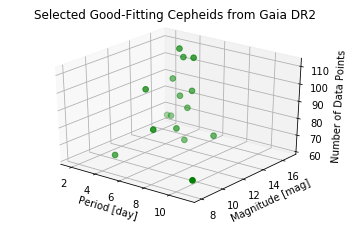

...

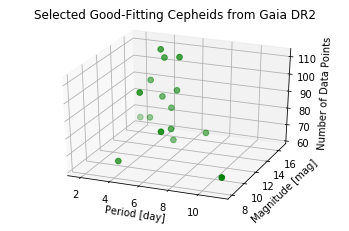

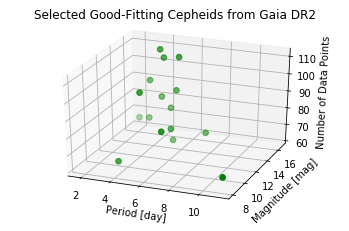

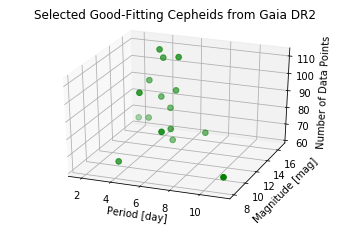

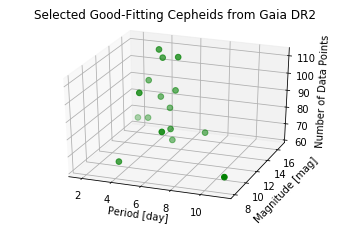

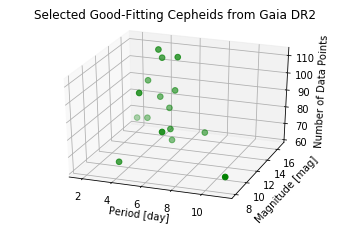

In [11]:
azims = np.arange(50,70.5,step=0.5)
for i in range(0,len(azims)):
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    ax.scatter(my16_pers, my16_mags, my16_nums, c='g', s=32)
    ax.set_title('Selected Good-Fitting Cepheids from Gaia DR2')
    ax.set_xlabel('Period [day]')
    ax.set_ylabel('Magnitude [mag]')
    ax.set_zlabel('Number of Data Points')
    ax.view_init(30, -azims[i])
    #ax.view_init(30, -60)
    ax.dist = 11
    #plt.savefig('My16_'+str(azims[i])+'.png', bbox_inches='tight', dpi=300)
    #print('ax.azim {}'.format(ax.azim))
    #print('ax.elev {}'.format(ax.elev))
    plt.show()